# DATASET PREP

In [1]:
import os, glob, random, json
from dataclasses import dataclass
from typing import List, Tuple
import matplotlib.pyplot as plt


import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# ----------------------------
# Reproducibility
# ----------------------------
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

SEED = 24
seed_everything(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# ----------------------------
# Config
# ----------------------------
@dataclass
class CFG:
    DATA_ROOT: str = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
    SCENES: Tuple[str, ...] = ("scene1", "scene2", "scene3", "scene4")
    PATCH_EXT: str = ".npz"

    # Global split (VD default)
    USE_GLOBAL_SPLIT: bool = True
    GLOBAL_TRAIN_RATIO: float = 0.80
    GLOBAL_VAL_RATIO: float = 0.10
    GLOBAL_TEST_RATIO: float = 0.10
    KEEP_VAL_TEST_NATURAL: bool = True

    # Keys inside npz
    X_KEY: str = "image"     # (12,512,512)
    A_KEY: str = "aerosol"   # (512,512) -> becomes 1 channel
    Y_KEY: str = "label"     # (512,512)

    # Fire patch definition
    FIRE_PATCH_MIN_RATIO: float = 0

    # Controlled train pool (VD default)
    USE_CONTROLLED_POOL: bool = True
    POOL_KEEP_FIRE: int = -1
    NONFIRE_PER_FIRE: int = 3

    # Training config (RAM-safe)
    IN_CHANNELS: int = 13
    H: int = 512
    W: int = 512
    BATCH_SIZE: int = 2
    NUM_WORKERS: int = 2
    LR: float = 1e-4
    EPOCHS: int = 20 

    VERBOSE: bool = True

cfg = CFG()

assert abs((cfg.GLOBAL_TRAIN_RATIO + cfg.GLOBAL_VAL_RATIO + cfg.GLOBAL_TEST_RATIO) - 1.0) < 1e-6
assert os.path.exists(cfg.DATA_ROOT), f"DATA_ROOT not found: {cfg.DATA_ROOT}"
print("DATA_ROOT OK:", cfg.DATA_ROOT)

Device: cuda
DATA_ROOT OK: /kaggle/input/sen2fire/Sen2Fire/Sen2Fire


In [2]:
def list_scene_files(data_root: str, scene_name: str, ext: str = ".npz") -> List[str]:
    scene_dir = os.path.join(data_root, scene_name)
    return sorted(glob.glob(os.path.join(scene_dir, f"*{ext}")))

scene_to_files = {}
total = 0
for s in cfg.SCENES:
    files = list_scene_files(cfg.DATA_ROOT, s, cfg.PATCH_EXT)
    scene_to_files[s] = files
    total += len(files)
    print(f"{s}: {len(files)} patches")

print("Total patches:", total)
if total == 0:
    raise RuntimeError("No patch files found. Check DATA_ROOT / PATCH_EXT.")


scene1: 864 patches
scene2: 594 patches
scene3: 504 patches
scene4: 504 patches
Total patches: 2466


In [3]:
def inspect_npz(npz_path: str):
    with np.load(npz_path) as data:
        return {k: (data[k].shape, str(data[k].dtype)) for k in data.keys()}

sample_path = scene_to_files[cfg.SCENES[0]][0]
print("Sample file:", sample_path)
info = inspect_npz(sample_path)
for k, (shape, dtype) in info.items():
    print(f"  - {k:>10s}: shape={shape}, dtype={dtype}")

for rk in [cfg.X_KEY, cfg.A_KEY, cfg.Y_KEY]:
    if rk not in info:
        raise KeyError(f"Missing key '{rk}' in npz. Found keys: {list(info.keys())}")


Sample file: /kaggle/input/sen2fire/Sen2Fire/Sen2Fire/scene1/scene_1_patch_10_1.npz
  -      image: shape=(12, 512, 512), dtype=int16
  -    aerosol: shape=(512, 512), dtype=float32
  -      label: shape=(512, 512), dtype=uint8


In [4]:
rows = []
for s, files in scene_to_files.items():
    for p in files:
        rows.append({"scene": s, "path": p})
manifest = pd.DataFrame(rows)

def fire_ratio_from_path(npz_path: str) -> float:
    with np.load(npz_path) as data:
        y = data[cfg.Y_KEY]
        if y.ndim == 3 and y.shape[-1] == 1:
            y = y[..., 0]
        yb = (y > 0).astype(np.uint8)
        return float(yb.mean())

fire_ratios = []
has_fire = []
for p in manifest["path"].tolist():
    r = fire_ratio_from_path(p)
    fire_ratios.append(r)
    has_fire.append(1 if r > cfg.FIRE_PATCH_MIN_RATIO else 0)

manifest["fire_ratio"] = fire_ratios
manifest["has_fire"] = has_fire

print("\nFULL dataset has_fire distribution:")
print(manifest["has_fire"].value_counts().sort_index())
print("\nFULL dataset has_fire ratio:")
print(manifest["has_fire"].value_counts(normalize=True).sort_index())



FULL dataset has_fire distribution:
has_fire
0    2117
1     349
Name: count, dtype: int64

FULL dataset has_fire ratio:
has_fire
0    0.858475
1    0.141525
Name: proportion, dtype: float64


In [5]:
def stratified_split(df, train_ratio, val_ratio, seed=42):
    df = df.sample(frac=1.0, random_state=seed).reset_index(drop=True)
    parts = []
    for cls in [0, 1]:
        sub = df[df["has_fire"] == cls].copy()
        n = len(sub)
        n_train = int(round(n * train_ratio))
        n_val   = int(round(n * val_ratio))
        sub_train = sub.iloc[:n_train]
        sub_val   = sub.iloc[n_train:n_train+n_val]
        sub_test  = sub.iloc[n_train+n_val:]
        parts.append((sub_train, sub_val, sub_test))

    train_df = pd.concat([parts[0][0], parts[1][0]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    val_df   = pd.concat([parts[0][1], parts[1][1]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    test_df  = pd.concat([parts[0][2], parts[1][2]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    return train_df, val_df, test_df

train_pool_df, val_df, test_df = stratified_split(
    manifest,
    train_ratio=cfg.GLOBAL_TRAIN_RATIO,
    val_ratio=cfg.GLOBAL_VAL_RATIO,
    seed=SEED
)

print("\nGLOBAL split counts:")
print("  Train pool:", len(train_pool_df))
print("  Val      :", len(val_df))
print("  Test     :", len(test_df))

# Controlled pool applies to TRAIN only
if cfg.USE_CONTROLLED_POOL:
    fire_df   = train_pool_df[train_pool_df["has_fire"] == 1].copy()
    nofire_df = train_pool_df[train_pool_df["has_fire"] == 0].copy()

    n_fire_total = len(fire_df)
    n_nofire_total = len(nofire_df)

    n_fire_keep = n_fire_total if cfg.POOL_KEEP_FIRE in (-1, None) else min(cfg.POOL_KEEP_FIRE, n_fire_total)
    fire_keep = fire_df.sample(n=n_fire_keep, random_state=SEED) if n_fire_keep > 0 else fire_df.iloc[:0]

    n_nofire_keep = min(n_nofire_total, n_fire_keep * int(cfg.NONFIRE_PER_FIRE))
    nofire_keep = nofire_df.sample(n=n_nofire_keep, random_state=SEED) if n_nofire_keep > 0 else nofire_df.iloc[:0]

    train_df = pd.concat([fire_keep, nofire_keep]).sample(frac=1.0, random_state=SEED).reset_index(drop=True)

    print("\nTRAIN controlled sampling:")
    print(f"  fire_total_in_pool   : {n_fire_total}")
    print(f"  nofire_total_in_pool : {n_nofire_total}")
    print(f"  fire_kept            : {len(fire_keep)}")
    print(f"  nofire_kept          : {len(nofire_keep)} (NONFIRE_PER_FIRE={cfg.NONFIRE_PER_FIRE})")
    print(f"  train_final          : {len(train_df)}")
else:
    train_df = train_pool_df.copy()

train_paths = train_df["path"].tolist()
val_paths   = val_df["path"].tolist()
test_paths  = test_df["path"].tolist()

# leakage check
assert len(set(train_paths)&set(val_paths))==0
assert len(set(train_paths)&set(test_paths))==0
assert len(set(val_paths)&set(test_paths))==0

print("\nFinal used split sizes:")
print("  train:", len(train_paths))
print("  val  :", len(val_paths))
print("  test :", len(test_paths))



GLOBAL split counts:
  Train pool: 1973
  Val      : 247
  Test     : 246

TRAIN controlled sampling:
  fire_total_in_pool   : 279
  nofire_total_in_pool : 1694
  fire_kept            : 279
  nofire_kept          : 837 (NONFIRE_PER_FIRE=3)
  train_final          : 1116

Final used split sizes:
  train: 1116
  val  : 247
  test : 246


In [6]:
class Sen2FireDataset(Dataset):
    def __init__(self, paths, with_label=True):
        self.paths = paths
        self.with_label = with_label

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        p = self.paths[idx]
        patch_name = os.path.basename(p)

        with np.load(p) as d:
            img12 = d[cfg.X_KEY].astype(np.float32)
            aer   = d[cfg.A_KEY].astype(np.float32)[None, ...]
            x = np.concatenate([img12, aer], axis=0)

            if self.with_label:
                y = d[cfg.Y_KEY]
                if y.ndim == 2:
                    y = y[None, ...]
                y = (y > 0).astype(np.float32)

                return torch.from_numpy(x), torch.from_numpy(y), patch_name
            else:
                return torch.from_numpy(x), patch_name

In [7]:
train_loader = DataLoader(Sen2FireDataset(train_paths, with_label=False),
                          batch_size=cfg.BATCH_SIZE, shuffle=True,
                          num_workers=cfg.NUM_WORKERS, pin_memory=True)

val_loader = DataLoader(Sen2FireDataset(val_paths, with_label=True),
                        batch_size=cfg.BATCH_SIZE, shuffle=False,
                        num_workers=cfg.NUM_WORKERS, pin_memory=True)

test_loader = DataLoader(Sen2FireDataset(test_paths, with_label=True),
                         batch_size=cfg.BATCH_SIZE, shuffle=False,
                         num_workers=cfg.NUM_WORKERS, pin_memory=True)


In [8]:
@torch.no_grad()
def compute_mean_std(loader, max_batches=50):
    mean = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    var  = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    n_batches = 0

    for bi, (x, y) in enumerate(loader):
        if bi >= max_batches:
            break
        x = x.to(DEVICE)  # (B,C,H,W)
        x_ = x.view(x.size(0), cfg.IN_CHANNELS, -1)
        mean += x_.mean(dim=(0,2))
        var  += x_.var(dim=(0,2), unbiased=False)
        n_batches += 1

    mean /= max(n_batches, 1)
    var  /= max(n_batches, 1)
    std = torch.sqrt(var + 1e-6)
    return mean.detach().cpu().tolist(), std.detach().cpu().tolist()

MEAN_13, STD_13 = compute_mean_std(train_loader, max_batches=50)
print("MEAN_13 len:", len(MEAN_13), "STD_13 len:", len(STD_13))


MEAN_13 len: 13 STD_13 len: 13


In [9]:
def normalize_batch(x, mean_13, std_13):
    mean_t = torch.tensor(mean_13, device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
    std_t  = torch.tensor(std_13,  device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
    return (x - mean_t) / (std_t + 1e-6)

# OUTPUT VISUALIZATION PREP

In [10]:
def analyze_block_fire_threshold(
    manifest,
    block_size=32,
    q_low=0.05,
    q_high=0.95,
    q_min=0.10
):
    """
    Output:
    - proporsi blok kosong
    - distribusi pixel api (blok berapi saja)
    - Q5 / Q10 / Q50 / Q90 / Q95
    - rekomendasi min_pixel (robust, buang noise & ekstrem)
    """
    fire_pixels = []
    zero_blocks = 0
    total_blocks = 0

    for p in manifest["path"]:
        with np.load(p) as d:
            y = d[cfg.Y_KEY]
            if y.ndim == 3:
                y = y[..., 0]

            yb = (y > 0).astype(np.uint8)
            H, W = yb.shape

            for i in range(0, H, block_size):
                for j in range(0, W, block_size):
                    block = yb[i:i+block_size, j:j+block_size]
                    pix = block.sum()
                    total_blocks += 1
                    if pix == 0:
                        zero_blocks += 1
                    else:
                        fire_pixels.append(pix)

    fire_pixels = np.array(fire_pixels)

    # statistik dasar
    zero_ratio = zero_blocks / total_blocks

    q5  = np.quantile(fire_pixels, 0.05)
    q10 = np.quantile(fire_pixels, 0.10)
    q50 = np.quantile(fire_pixels, 0.50)
    q90 = np.quantile(fire_pixels, 0.90)
    q95 = np.quantile(fire_pixels, 0.95)

    # buang ekstrem → ambil core distribusi
    low  = np.quantile(fire_pixels, q_low)
    high = np.quantile(fire_pixels, q_high)
    core = fire_pixels[(fire_pixels >= low) & (fire_pixels <= high)]

    # threshold MINIMUM yang masuk akal
    min_pixel = int(np.quantile(core, q_min))

    return {
        "block_size": block_size,
        "total_blocks": total_blocks,
        "zero_block_ratio": zero_ratio,
        "fire_block_count": len(fire_pixels),
        "quantiles": {
            "Q5": q5,
            "Q10": q10,
            "Q50": q50,
            "Q90": q90,
            "Q95": q95,
        },
        "recommended_min_pixel": min_pixel,
        "recommended_min_pixel_pct": min_pixel / (block_size * block_size)
    }

In [11]:
import torch
import numpy as np

@torch.no_grad()
def fire_area_preview_with_samples(model, loader, t_best=0.05, min_pixel=30.42,k=16, eps_area=1e-3, a1=0.15, a2=0.3):
    model.eval()
    buckets = {
        "NO_FIRE": [],
        "LOW_FIRE": [],
        "MID_FIRE": [],
        "HIGH_FIRE": [],
    }

    # Kumpulkan sample dulu
    for x, y, patch_name in loader:
        x = x.to(DEVICE)
        x = normalize_batch(x, MEAN_13, STD_13)

        probs = torch.sigmoid(model(x))  # (B, C, H, W) hasil prediksi sigmoid
        mask = (probs >= t_best).float()  # Mask berdasarkan threshold t_best
        area = mask.mean(dim=(1, 2, 3))  # Hitung area api (rata-rata per sample)

        # Loop untuk membagi sample ke dalam buckets berdasarkan area kebakaran
        for i in range(len(area)):
            sample_dict = {
                "img": x[i].cpu(),
                "mask_raw": probs[i, 0].cpu(),
                "mask_pred": mask[i, 0].cpu(), 
                "mask_gt": y[i, 0].cpu(),
                "area": float(area[i]),
                "patch_name": patch_name[i]
            }

            # Tentukan kategori berdasarkan area
            if area[i] < eps_area:
                buckets["NO_FIRE"].append(sample_dict)
            elif area[i] < a1:
                buckets["LOW_FIRE"].append(sample_dict)
            elif area[i] < a2:
                buckets["MID_FIRE"].append(sample_dict)
            else:
                buckets["HIGH_FIRE"].append(sample_dict)

            # Lakukan blockify dan thresholding per blok 16x16 dengan kriteria tambahan
            fire_mask = blockify_and_threshold(probs[i, 0], k, min_pixel)  # Panggil fungsi blockify dengan threshold 30.42 pixel

            # Update mask_pred dengan blok yang telah diproses
            sample_dict["mask_pred_blocked"] = fire_mask.cpu()

    # Print dan return supaya bisa digunakan untuk overlay
    print("=== FIRE AREA PREVIEW ===")
    for k, samples in buckets.items():
        if len(samples) == 0:
            print(f"[{k}] kosong")
            continue

        areas = np.array([s["area"] for s in samples])
        print(f"[{k}] count={len(samples)} | mean_area={areas.mean():.4f}")
        picks = np.random.choice(len(samples), min(5, len(samples)), replace=False)
        for idx in picks:
            print(f"  sample → Area={areas[idx]:.4f}")

    return buckets  # Simpan semua sample per kategori


def blockify_and_threshold(pred_map, block_size, threshold):
    # Ambil ukuran image (height, width)
    H, W = pred_map.shape

    # Inisialisasi tensor untuk menyimpan hasil akhir
    blocked_map = torch.zeros_like(pred_map)

    # Tentukan jumlah minimal pixel api yang diperlukan agar blok dianggap api (misalnya 30.42 pixel)
    required_fire_pixels = threshold  # Gunakan threshold yang diberikan (30.42)

    # Loop untuk setiap blok 16x16
    for i in range(0, H, block_size):
        for j in range(0, W, block_size):
            # Ambil blok 16x16
            block = pred_map[i:i+block_size, j:j+block_size]

            # Hitung jumlah pixel api dalam blok
            fire_pixels = np.sum(block.cpu().numpy())  # Jumlah pixel api dalam blok

            # Jika jumlah pixel api lebih dari threshold (misalnya 30.42 pixel), set blok tersebut jadi 1
            if fire_pixels >= required_fire_pixels:
                blocked_map[i:i+block_size, j:j+block_size] = 1

    return blocked_map

In [12]:
from sklearn.metrics import f1_score
import pandas as pd
import numpy as np
import torch

@torch.no_grad()
def evaluate_block_sizes_pixel_f1(
    model,
    loader,
    manifest,
    block_sizes=[32, 40, 48, 56],
    t_best=0.05
):
    results = []
    model.eval()

    for bs in block_sizes:
        # 1️⃣ ambil min_pixel dari GT
        stats = analyze_block_fire_threshold(
            manifest,
            block_size=bs
        )
        min_pixel = stats["recommended_min_pixel"]

        gt_pixels_all = []
        pred_pixels_all = []

        for x, y, _ in loader:
            x = x.to(DEVICE)
            y = y.to(DEVICE)

            x = normalize_batch(x, MEAN_13, STD_13)

            probs = torch.sigmoid(model(x))
            pred_bin = (probs >= t_best).float()

            for i in range(x.size(0)):
                # GT asli → pixel-level
                gt_pixel = (y[i, 0] > 0).float()

                # pred → blockify → balik ke pixel
                pred_block = blockify_and_threshold(
                    pred_bin[i, 0], bs, min_pixel
                )

                gt_pixels_all.append(gt_pixel.view(-1).cpu().numpy())
                pred_pixels_all.append(pred_block.view(-1).cpu().numpy())

        gt_pixels_all = np.concatenate(gt_pixels_all)
        pred_pixels_all = np.concatenate(pred_pixels_all)

        f1 = f1_score(gt_pixels_all, pred_pixels_all)

        results.append({
            "block_size": bs,
            "recommended_min_pixel": min_pixel,
            "min_pixel_pct": min_pixel / (bs * bs),
            "pixel_f1": f1
        })

    return pd.DataFrame(results).sort_values(
        "pixel_f1", ascending=False
    )

In [13]:
def show_fire_samples_grid(buckets, bucket_name, n=5, swir_idx=10):
    samples = buckets[bucket_name][:n]

    fig, axes = plt.subplots(n, 4, figsize=(18, 4*n))

    if n == 1:
        axes = axes[None, :]

    for i, sample in enumerate(samples):
        # === SWIR IMAGE ===
        swir = sample["img"][swir_idx].numpy()
        swir_vis = (swir - swir.min()) / (swir.max() - swir.min() + 1e-8)

        mask_gt   = sample["mask_gt"].numpy()
        mask_raw  = sample["mask_raw"].numpy()
        mask_pred = sample.get("mask_pred_blocked", sample["mask_pred"]).numpy()

        area_val  = sample["area"]
        patch     = sample["patch_name"]

        axes[i,0].imshow(swir_vis, cmap="gray")
        axes[i,0].set_title(f"{patch}\nSWIR | Area={area_val:.4f}", fontsize=12)
        axes[i,0].axis('off')

        axes[i,1].imshow(mask_gt, cmap="Reds")
        axes[i,1].set_title("Ground Truth", fontsize=14)
        axes[i,1].axis('off')

        axes[i,2].imshow(mask_raw, cmap="Reds")
        axes[i,2].set_title("Prediction (raw sigmoid)", fontsize=14)
        axes[i,2].axis('off')

        axes[i,3].imshow(mask_pred, cmap="Reds")
        axes[i,3].set_title("Prediction (blockified)", fontsize=14)
        axes[i,3].axis('off')

    plt.tight_layout()
    plt.show()

In [14]:
!pip install -q segmentation-models-pytorch


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.8 MB/s eta 0:00:00


In [15]:
import segmentation_models_pytorch as smp
criterion = nn.BCEWithLogitsLoss()

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

# STATIC THR 

## 1. show model resnet

In [16]:
def build_unet(in_channels=13):
    model = smp.Unet(
        encoder_name="resnet18",
        encoder_weights="imagenet",
        in_channels=in_channels,
        classes=1,
        activation=None
    )
    return model
    
model_resnet = build_unet(cfg.IN_CHANNELS).to(DEVICE)
print("Model:", type(model_resnet).__name__)

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

Model: Unet


In [17]:
ckpt = torch.load(
    "/kaggle/input/unet-resnet-pretrained/pytorch/default/1/unet_best_retrained2.pth",
    map_location=DEVICE,
    weights_only=False  # biar load semua, bukan cuma weights
)
model_resnet.load_state_dict(ckpt["model_state"])

<All keys matched successfully>

In [19]:
size_unet_resnet = evaluate_block_sizes_pixel_f1(
    model_resnet,
    val_loader,
    manifest,
    block_sizes=[32, 40, 48, 56, 64, 72, 96]
)

print(size_unet_resnet)

   block_size  recommended_min_pixel  min_pixel_pct  pixel_f1
4          64                   1000       0.244141  0.718498
2          48                    768       0.333333  0.715319
1          40                    587       0.366875  0.713482
3          56                    448       0.142857  0.712242
0          32                    496       0.484375  0.709995
6          96                   1032       0.111979  0.708032
5          72                    576       0.111111  0.703825


In [20]:
t_best = 0.05
min_pixel = 1000
blok_pixel = 64
test_buckets = fire_area_preview_with_samples(model_resnet, test_loader, t_best=t_best, min_pixel=min_pixel, k=blok_pixel)

=== FIRE AREA PREVIEW ===
[NO_FIRE] count=168 | mean_area=0.0001
  sample → Area=0.0000
  sample → Area=0.0001
  sample → Area=0.0000
  sample → Area=0.0001
  sample → Area=0.0000
[LOW_FIRE] count=65 | mean_area=0.0254
  sample → Area=0.1497
  sample → Area=0.0032
  sample → Area=0.0182
  sample → Area=0.1221
  sample → Area=0.0049
[MID_FIRE] count=4 | mean_area=0.2300
  sample → Area=0.2827
  sample → Area=0.1507
  sample → Area=0.2507
  sample → Area=0.2359
[HIGH_FIRE] count=9 | mean_area=0.4277
  sample → Area=0.3279
  sample → Area=0.4202
  sample → Area=0.6213
  sample → Area=0.5828
  sample → Area=0.3421


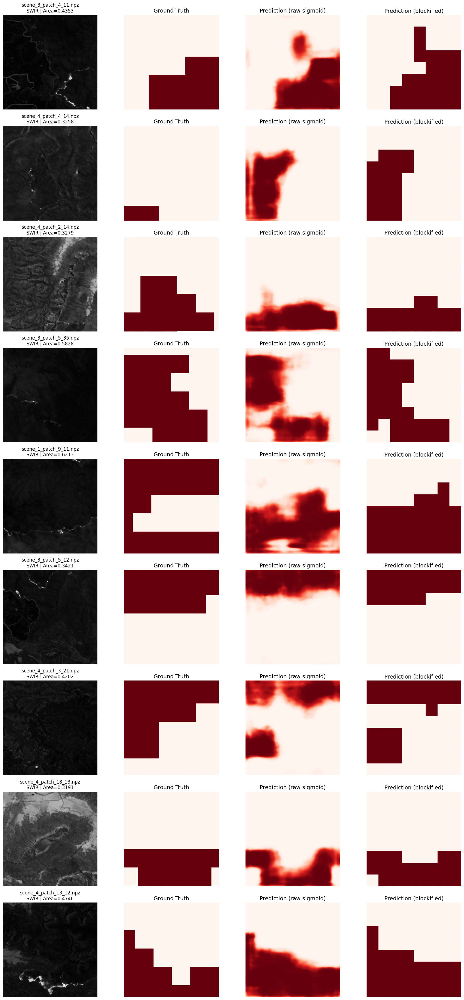

In [22]:
show_fire_samples_grid(test_buckets, "HIGH_FIRE", n=9)

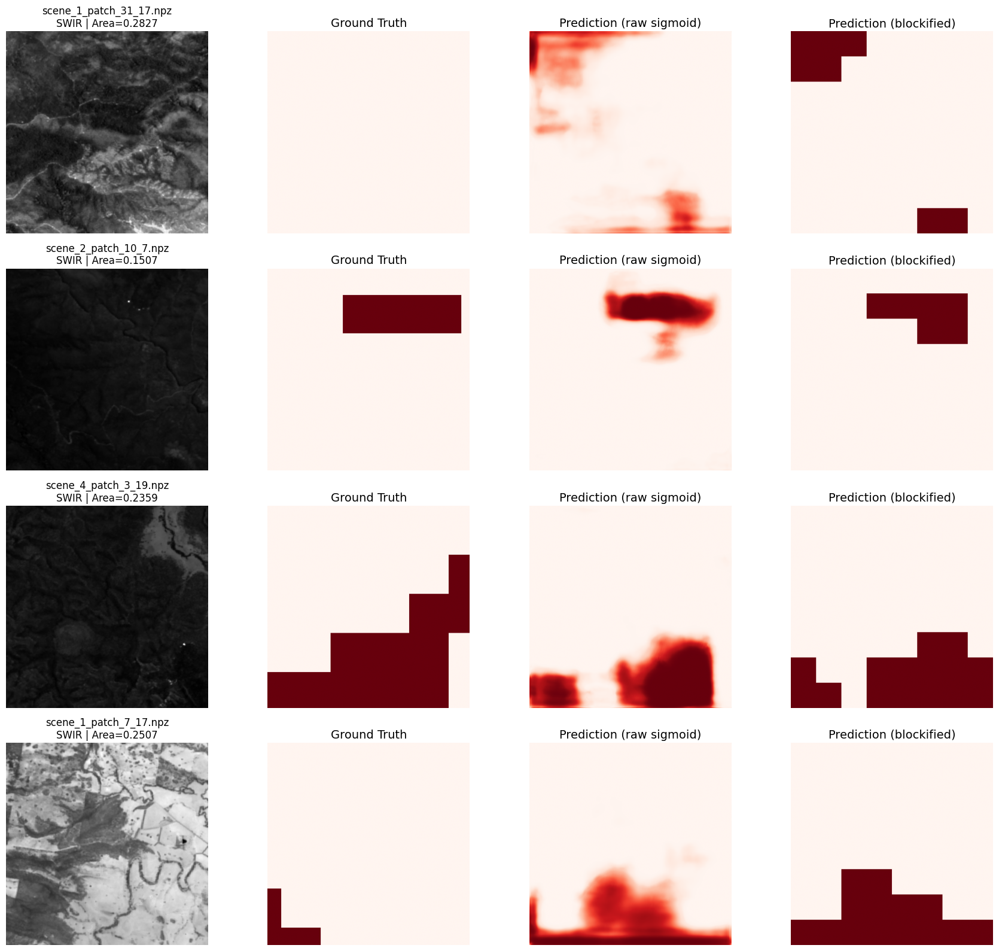

In [23]:
show_fire_samples_grid(test_buckets, "MID_FIRE", n=4)

## 2. show model eff

In [43]:
def build_unet(in_channels=13):
    model = smp.Unet(
        encoder_name="efficientnet-b4",
        encoder_weights="imagenet",
        in_channels=in_channels,
        classes=1,
        activation=None
    )
    return model
    
model_eff = build_unet(cfg.IN_CHANNELS).to(DEVICE)
print("Model:", type(model_eff).__name__)

Model: Unet


In [44]:
ckpt = torch.load(
    "/kaggle/input/unet-eff-pretrained/pytorch/default/1/efficientb4_pretrained.pth",
    map_location=DEVICE,
    weights_only=False  # biar load semua, bukan cuma weights
)
model_eff.load_state_dict(ckpt["model_state"])

<All keys matched successfully>

In [20]:
size_unet_eff = evaluate_block_sizes_pixel_f1(
    model_eff,
    val_loader,
    manifest,
    block_sizes=[32, 48, 56, 64, 72, 96]
)

print(size_unet_eff)

   block_size  recommended_min_pixel  min_pixel_pct  pixel_f1
2          56                    448       0.142857  0.740714
3          64                   1000       0.244141  0.740020
4          72                    576       0.111111  0.738991
1          48                    768       0.333333  0.736426
0          32                    496       0.484375  0.734305
5          96                   1032       0.111979  0.732204


In [45]:
t_best = 0.05
min_pixel = 448 
blok_pixel = 56
test_buckets = fire_area_preview_with_samples(model_eff, test_loader, t_best=t_best, min_pixel=min_pixel, k=blok_pixel)

=== FIRE AREA PREVIEW ===
[NO_FIRE] count=203 | mean_area=0.0001
  sample → Area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
[LOW_FIRE] count=28 | mean_area=0.0276
  sample → Area=0.0358
  sample → Area=0.0065
  sample → Area=0.0157
  sample → Area=0.0014
  sample → Area=0.0620
[MID_FIRE] count=7 | mean_area=0.2275
  sample → Area=0.2607
  sample → Area=0.1898
  sample → Area=0.1712
  sample → Area=0.1906
  sample → Area=0.2806
[HIGH_FIRE] count=8 | mean_area=0.5311
  sample → Area=0.5119
  sample → Area=0.9328
  sample → Area=0.3304
  sample → Area=0.3678
  sample → Area=0.6136


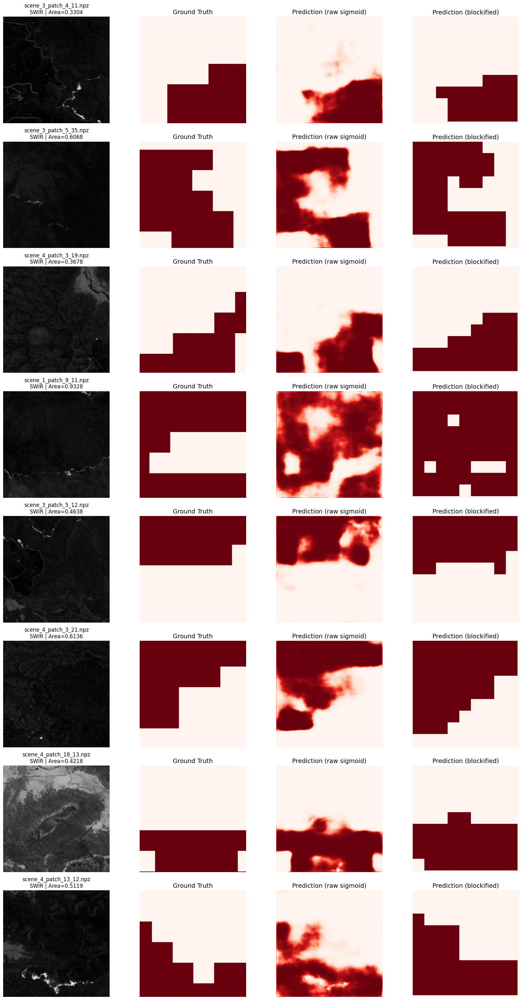

In [46]:
show_fire_samples_grid(test_buckets, "HIGH_FIRE", n=8)

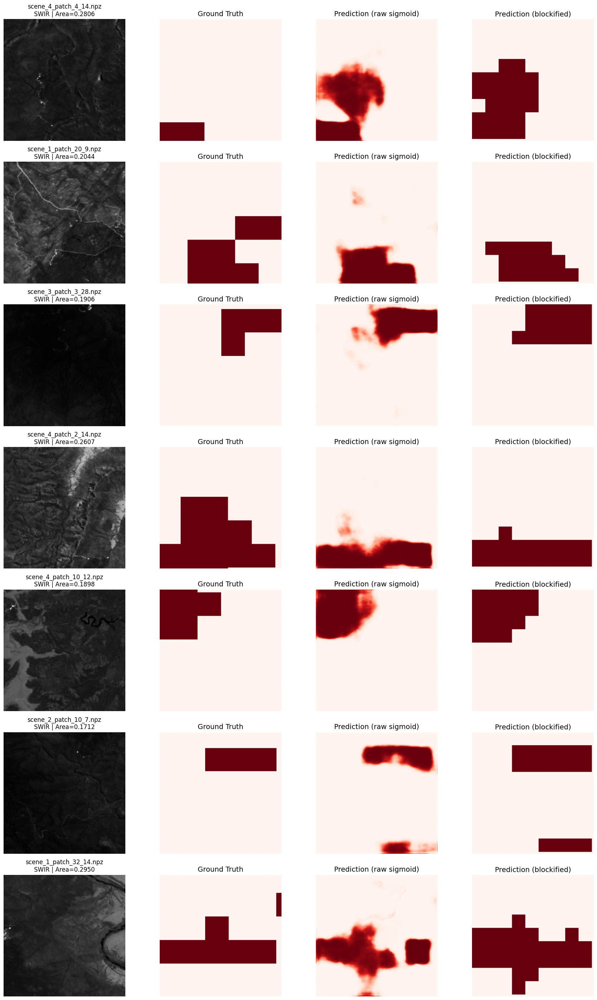

In [47]:
show_fire_samples_grid(test_buckets, "MID_FIRE", n=7)

## 3. show model deeplab-eff

In [33]:
def build_deeplab(in_channels=13):
    model = smp.DeepLabV3Plus(
        encoder_name="efficientnet-b4", 
        encoder_weights="imagenet",
        in_channels=in_channels,
        classes=1,
        activation=None
    )
    return model

model_deeplab = build_deeplab(cfg.IN_CHANNELS).to(DEVICE)
print("Model:", type(model_deeplab).__name__)

Model: DeepLabV3Plus


In [34]:
ckpt = torch.load(
    "/kaggle/input/deeplab-valid/pytorch/default/1/deeplab-b4_retrain_valid.pth",
    map_location=DEVICE,
    weights_only=False  # biar load semua, bukan cuma weights
)
model_deeplab.load_state_dict(ckpt["model_state"])

<All keys matched successfully>

In [35]:
size_deeplab_eff = evaluate_block_sizes_pixel_f1(
    model_deeplab,
    val_loader,
    manifest,
    block_sizes=[32, 40, 48, 56, 64, 72, 96]
)

print(size_deeplab_eff)

   block_size  recommended_min_pixel  min_pixel_pct  pixel_f1
4          64                   1000       0.244141  0.713804
1          40                    587       0.366875  0.707694
6          96                   1032       0.111979  0.706758
3          56                    448       0.142857  0.706552
2          48                    768       0.333333  0.706504
5          72                    576       0.111111  0.701868
0          32                    496       0.484375  0.699789


In [36]:
t_best = 0.05
min_pixel = 1000
blok_pixel = 64
test_buckets = fire_area_preview_with_samples(model_deeplab, test_loader, t_best=t_best, min_pixel=min_pixel, k=blok_pixel)

=== FIRE AREA PREVIEW ===
[NO_FIRE] count=183 | mean_area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
  sample → Area=0.0000
[LOW_FIRE] count=47 | mean_area=0.0311
  sample → Area=0.0234
  sample → Area=0.0271
  sample → Area=0.0209
  sample → Area=0.0050
  sample → Area=0.0992
[MID_FIRE] count=8 | mean_area=0.2349
  sample → Area=0.2981
  sample → Area=0.2923
  sample → Area=0.2184
  sample → Area=0.2365
  sample → Area=0.2410
[HIGH_FIRE] count=8 | mean_area=0.4372
  sample → Area=0.3412
  sample → Area=0.3221
  sample → Area=0.3531
  sample → Area=0.4216
  sample → Area=0.3278


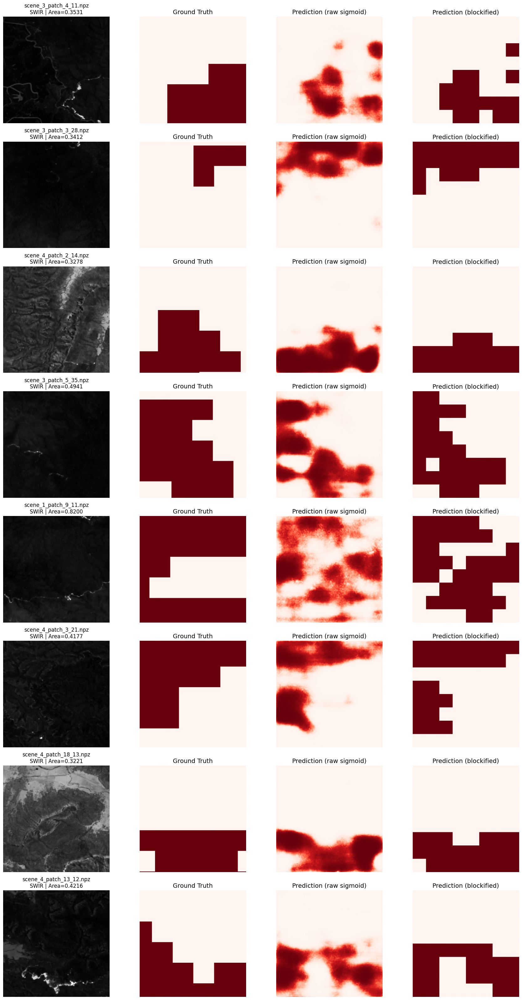

In [39]:
show_fire_samples_grid(test_buckets, "HIGH_FIRE", n=8)

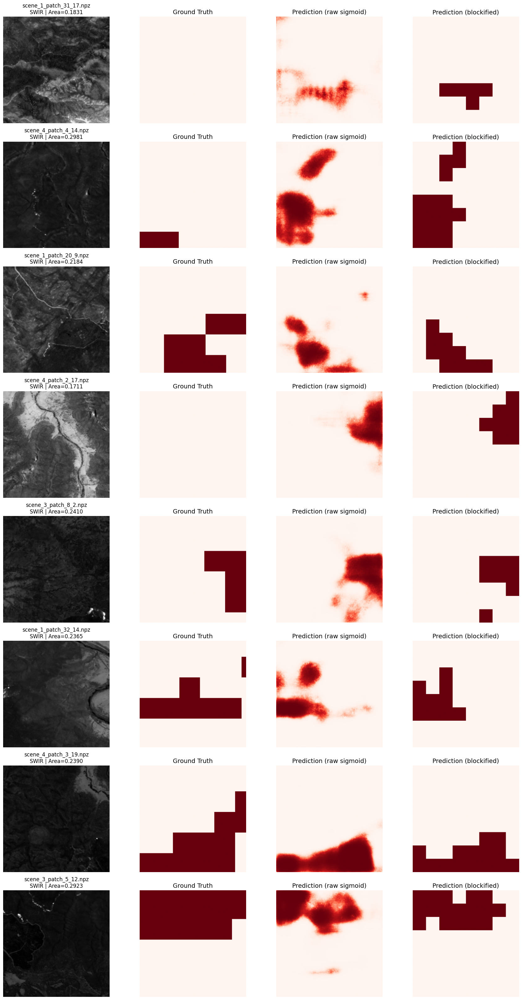

In [40]:
show_fire_samples_grid(test_buckets, "MID_FIRE", n=8)